In [1]:
pwd

'/home/vmu/nu_stats'

In [2]:
%cd examples

/home/vmu/nu_stats/examples


In [3]:
%load_ext autoreload
%autoreload 2

# SIM

In [4]:
from astropy import units as u
import numpy as np
from matplotlib import pyplot as plt

In [5]:
import sys
sys.path.append("../")
from nu_stats.simulation import Simulation
from nu_stats.plotting import unit_vectors_skymap as u_v_s

In [6]:
# Simulation parameters
L = 1e48 * (u.erg/u.s)
gamma = 2.2
z = 0.3
atm_flux_norm = 1e-15 * 1/(u.GeV * u.cm**2 * u.s)
Emin = 1e5 * u.GeV
Emax = 1e8 * u.GeV
Enorm = 1e5 * u.GeV

In [7]:
sim = Simulation(L, gamma, z,
    atm_flux_norm = atm_flux_norm,
    Emin=Emin, Emax=Emax, Enorm=Enorm,
    N_events=1000
    )
sim.run(seed=40)


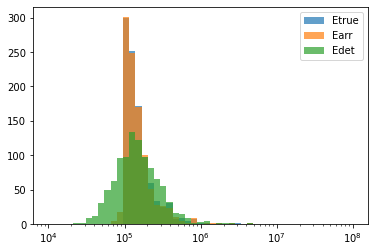

In [8]:
sim.show_spectrum()

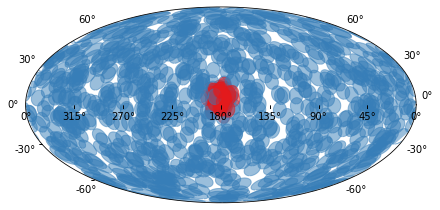

In [9]:
sim.show_skymap()

In [10]:
# Extract simulated data and get info needed for fit
fit_input = sim.get_data()

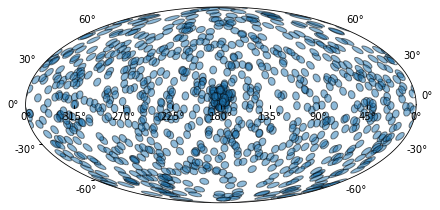

In [11]:
u_v_s(fit_input['det_dir']);

# FQTIST FIT

In [12]:
from nu_stats.fqutils import FqStructure, plot_loghist

In [13]:
# With energy part
fq = FqStructure(fit_input=fit_input)
fq.construct_atm_bg_energy_likelihood(
    Emin, Emax, n_Esim=100000,
    Nbins=50, prefab_likelihood_file='tmp/atmospheric_50lik.npy'
    )
fq.construct_source_energy_likelihood(
    fit_input['z'], Emin, Emax, min_index=1.5, max_index=4.0, n_Esim=100000,
    Nbins=50, prefab_likelihood_file='tmp/True0.3_50lik.npy'
)

Generating atmospheric background energy likelihood..
Separate marginalized energy likelihood generated for bg.
Generating marginalized energy likelihood..
Marginalized energy likelihood generated.


## Individual associations

In [14]:
bg_sim = Simulation(atm_flux_norm=atm_flux_norm, Emin=Emin, Emax=Emax, Enorm=Enorm, N_events=100000)
bg_sim.run(seed=12345678)
bg_dat = bg_sim.get_data()

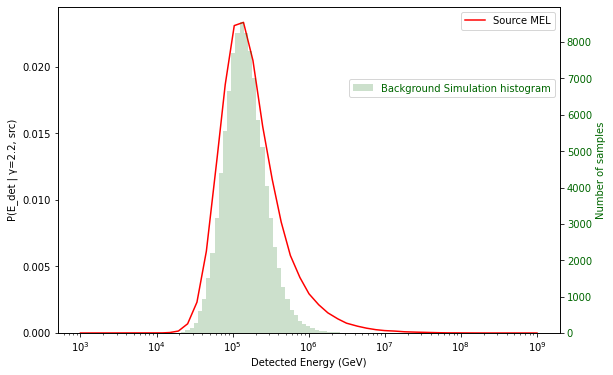

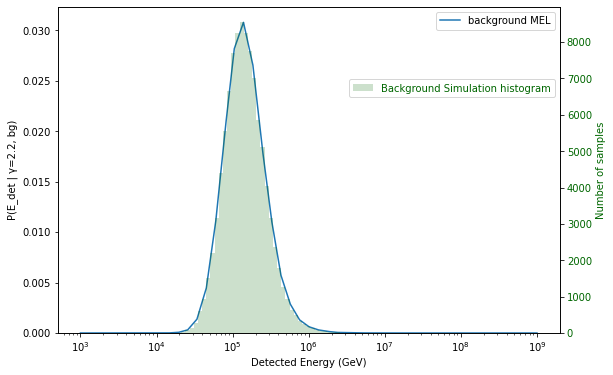

In [15]:
fig, ax = plt.subplots()

fq.energy_likelihood.plot_pdf_at_idx(gamma, color = 'r')
plt.legend(['Source MEL'], loc='upper right')
ax.set_xlabel('Detected Energy (GeV)')
ax.set_ylabel(f'P(E_det | γ={gamma:.2}, src)')
ax.set_ylim(0,(ax.get_ylim()[1]))

axh = ax.twinx()

plot_loghist(bg_dat['Edet'],50,color=(0,0.4,0,0.2))
sim_col = (0,0.4,0)
plt.legend(['Background Simulation histogram'],
    loc = 'center right',
    bbox_to_anchor = (0.5, 0.5, 0.5, 0.5),
    labelcolor = sim_col
)
axh.set_ylabel('Number of samples', color=sim_col)
axh.tick_params(axis='y', labelcolor=sim_col)

fig.set_size_inches(*(fig.get_size_inches()*1.5))
fig.show()

fig, ax = plt.subplots()

fq.bg_energy_likelihood.plot_pdf()
plt.legend(['background MEL'], loc='upper right')
ax.set_xlabel('Detected Energy (GeV)')
ax.set_ylabel(f'P(E_det | γ={gamma:.2}, bg)')
ax.set_ylim(0,(ax.get_ylim()[1]))

axh = ax.twinx()

plot_loghist(bg_dat['Edet'],50,color=(0,0.4,0,0.2))
sim_col = (0,0.4,0)
plt.legend(['Background Simulation histogram'],
    loc = 'center right',
    bbox_to_anchor = (0.5, 0.5, 0.5, 0.5),
    labelcolor = sim_col
)
axh.set_ylabel('Number of samples', color=sim_col)
axh.tick_params(axis='y', labelcolor=sim_col)

fig.set_size_inches(*(fig.get_size_inches()*1.5))
fig.show()


In [16]:
## get p values
sim_TS, bg_TS, sim_p = fq.event_statistics(fit_input, bg_dat, gamma)

In [17]:
sig = .998
## set label 0 for p<(1-sig) and 1 for p>=(1-sig)
labels = (sim_p >=(1-sig)).astype(int)

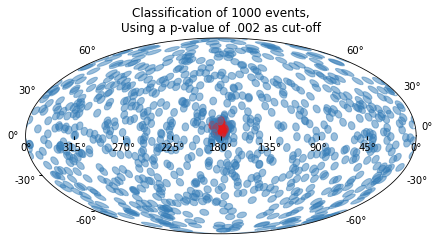

In [35]:
u_v_s(fit_input['det_dir'], labels);
plt.title('Classification of 1000 events,\nUsing a p-value of .002 as cut-off');


In [19]:
np.mean(labels == sim.labels)

0.954

In [20]:
print(f'Source event fraction\nfit: {np.mean(1-labels)}\n\
true: {np.mean(1-sim.labels)}\n\n\
False source events: {np.inner(sim.labels, 1-labels)}\n\
False bg events: {np.inner(labels, 1-sim.labels)}')

Source event fraction
fit: 0.078
true: 0.12

False source events: 2
False bg events: 44


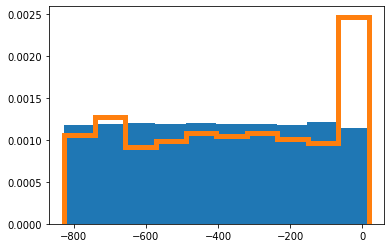

In [21]:
bg_TS.sort()
plt.hist(bg_TS,density=True);
plt.hist(sim_TS,histtype='step',linewidth=5,density=True);

# BHM

In [22]:
from nu_stats.bhmutils import BhStructure

In [23]:
bhm = BhStructure(fit_input)
bhm.load_model("stan/bhm_atm_fixedgamma.stan")
bhm.run()

INFO:cmdstanpy:found newer exe file, not recompiling
INFO:cmdstanpy:compiled model file: /home/vmu/nu_stats/examples/stan/bhm_atm_fixedgamma
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:start chain 2
INFO:cmdstanpy:start chain 3
INFO:cmdstanpy:start chain 4
INFO:cmdstanpy:finish chain 4
INFO:cmdstanpy:finish chain 2
INFO:cmdstanpy:finish chain 3
INFO:cmdstanpy:finish chain 1


In [24]:
bhm.print_diagnostic()

INFO:cmdstanpy:Processing csv files: /tmp/tmpj0dhmkgj/bhm_atm_fixedgamma-202105231755-1-l3f3ogre.csv, /tmp/tmpj0dhmkgj/bhm_atm_fixedgamma-202105231755-2-_ke40zsa.csv, /tmp/tmpj0dhmkgj/bhm_atm_fixedgamma-202105231755-3-6fwrwas0.csv, /tmp/tmpj0dhmkgj/bhm_atm_fixedgamma-202105231755-4-gkpdnovn.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.


## Individual associations


In [25]:
association = bhm.association_probs()
lp2 = bhm.association_probs(False)

In [26]:
np.intersect1d(association[np.where(association[:,0]>.5)[0],0],
    association[:,0], return_indices=True)[2]

array([254, 706, 421, 302, 264,  77, 788, 608, 631, 116, 980, 370, 636,
       824, 491, 457, 408,  92, 828, 629, 563, 474,  75, 280, 504, 388,
       400, 122, 933, 583, 998, 976, 375, 902, 433, 678, 948, 839, 988,
       192, 101, 472, 220, 490, 574, 286, 383, 528, 417, 385, 657, 544,
       617, 161,  54, 743, 990, 844, 909, 787, 132, 275, 328, 622, 591,
       359, 556, 432, 156, 396, 253,   0, 175,  13, 666, 309, 203, 566,
       947, 851, 224, 728, 397, 989,  39, 349, 202, 739, 985,  45, 201,
        31, 527, 297, 459, 315, 428, 425, 794, 956, 353, 166, 823, 994,
       911, 143, 530, 796,  66, 335, 882, 225, 351, 891,  63, 727, 774,
       133, 199, 206, 908, 763, 451])

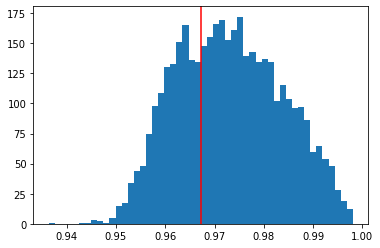

In [27]:
idx = 0
plt.hist(lp2[idx,0], bins=50);
plt.axvline(association[idx,0], color='r');

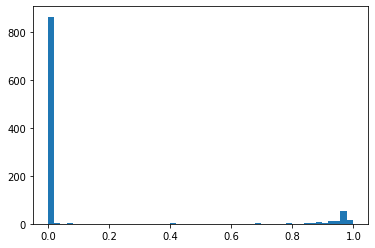

In [28]:
plt.hist(association[:,0], bins=50);

In [29]:
labels_b = 1-(association[:,0] > .95).astype(int)

Text(0.5, 1.0, 'Classification of 1000 events,\nUsing .95 source association probability as cut-off')

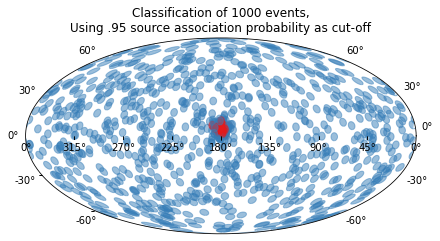

In [34]:
u_v_s(fit_input['det_dir'], labels_b);
plt.title('Classification of 1000 events,\nUsing .95 source association probability as cut-off');


In [31]:
np.mean(labels_b == sim.labels)

0.951

In [32]:
print(f'Source event fraction\nfit: {np.mean(1-labels_b)}\n\
true: {np.mean(1-sim.labels)}\n\n\
False source events: {np.inner(sim.labels, 1-labels_b)}\n\
False bg events: {np.inner(labels_b, 1-sim.labels)}')

Source event fraction
fit: 0.075
true: 0.12

False source events: 2
False bg events: 47


In [33]:
fit_input['Edet'].min()

23494.10395806645